# totalVI on thymus 111 data (positive selection)

Zoë Steier

* Run totalVI on positive selection subset

## Imports and settings

In [1]:
# Import required packages

import csv
import gzip
import os
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import scanpy as sc
import anndata
import copy
import seaborn as sns

import scvi
from scvi.dataset import GeneExpressionDataset, CellMeasurement, AnnDatasetFromAnnData, Dataset10X
from scvi.models import VAE, TOTALVI
from scvi.inference import TotalPosterior, TotalTrainer, Posterior, UnsupervisedTrainer

from scipy.special import softmax
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

%load_ext autoreload
%autoreload 2
%matplotlib inline

scvi.set_seed(0)

/data/yosef2/users/zsteier/programs/miniconda/envs/scvi_065/lib/python3.7/site-packages/umap/spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets


In [2]:
# Set number of available cores for scanpy

sc.settings.n_jobs = 10

In [3]:
# GPU settings

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID" 
os.environ['CUDA_VISIBLE_DEVICES']='2'

In [4]:
# Plotting settings

colors = ["#3B7EA1", "#FDB515", "#D9661F", "#859438", "#EE1F60", "#00A598"]
sns.set(context="notebook", font_scale=1.3, style="ticks")
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['savefig.transparent'] = True
sc.settings._vector_friendly = True
import matplotlib.colors as mcolors
DPI = 300

In [5]:
# Set save path

save_path = '/data/yosef2/users/zsteier/TotalSeq/20190814_BioLegend_ZRS08/analysis/totalVI_thymus/thymus111_allbatches_stable_posselecting/'

## Load data
Cells undergoing positive selection were subset as clusters from full dataset after running totalVI. New varibale genes were selected for this subset using seurat v3 HVG method implemented in scVI, and additional genes of interested were included.

In [6]:
# Load data as anndata objects
dataset_pos_subset = anndata.read(save_path + "thymus111_pos_subset.h5ad")

In [7]:
dataset_pos_subset

AnnData object with n_obs × n_vars = 35943 × 15808
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_protein_counts', 'n_proteins', 'batch'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'encode', 'ofinterest', 'hvg_encode', 'hvg_plus'
    uns: 'protein_names'
    obsm: 'protein_expression'

In [8]:
dataset_pos_subset.uns["protein_names"]

array(['ADT_CD102_A0104', 'ADT_CD103_A0201', 'ADT_CD106_A0226',
       'ADT_CD115(CSF-1R)_A0105', 'ADT_CD117(c-Kit)_A0012',
       'ADT_CD11a_A0595', 'ADT_CD11c_A0106', 'ADT_CD122(IL-2Rb)_A0227',
       'ADT_CD127(IL-7Ra)_A0198', 'ADT_CD134(OX-40)_A0195',
       'ADT_CD135_A0098', 'ADT_CD137_A0194', 'ADT_CD14_A0424',
       'ADT_CD140a_A0573', 'ADT_CD15(SSEA-1)_A0076',
       'ADT_CD150(SLAM)_A0203', 'ADT_CD16-32_A0109',
       'ADT_CD169(Siglec-1)_A0440', 'ADT_CD172a(SIRPa)_A0422',
       'ADT_CD183(CXCR3)_A0228', 'ADT_CD184(CXCR4)_A0444',
       'ADT_CD19_A0093', 'ADT_CD192(CCR2)_A0426', 'ADT_CD195(CCR5)_A0376',
       'ADT_CD196(CCR6)_A0225', 'ADT_CD197(CCR7)_A0377', 'ADT_CD20_A0192',
       'ADT_CD200(OX2)_A0079', 'ADT_CD201(EPCR)_A0439',
       'ADT_CD204(Msr1)_A0448', 'ADT_CD206(MMR)_A0173',
       'ADT_CD21-CD35(CR2-CR1)_A0107', 'ADT_CD223(LAG-3)_A0378',
       'ADT_CD23_A0108', 'ADT_CD24_A0212', 'ADT_CD25_A0097',
       'ADT_CD274(B7-H1_PD-L1)_A0190', 'ADT_CD278(ICOS)_A0171',
 

## Prepare dataset for totalVI

### Filter proteins and genes

In [9]:
# Filter unwanted proteins (HTO)
keep_pro_111 = np.array([not p.startswith("HTO") for p in dataset_pos_subset.uns["protein_names"]])

In [10]:
# Filter out hashtags and isotype controls

dataset_pos_subset.obsm["protein_expression"] = dataset_pos_subset.obsm["protein_expression"][:, keep_pro_111]
dataset_pos_subset.uns["protein_names"] = dataset_pos_subset.uns["protein_names"][keep_pro_111]

In [11]:
# Find highly variable genes (plus genes encoding proteins and other genes of interest) and use for totalVI

hvg_pos_subset = dataset_pos_subset.var["hvg_plus"]
hvg_pos_subset.sum()

5108

### Make totalVI dataset object

In [12]:
# All data

dataset = AnnDatasetFromAnnData(ad = dataset_pos_subset[:, hvg_pos_subset],
                                                cell_measurements_col_mappings = {"protein_expression":"protein_names"})
dataset

[2020-05-30 19:03:29,954] INFO - scvi.dataset.dataset | Remapping batch_indices to [0,N]
[2020-05-30 19:03:29,959] INFO - scvi.dataset.dataset | Remapping labels to [0,N]
[2020-05-30 19:03:33,663] INFO - scvi.dataset.dataset | Computing the library size for the new data
[2020-05-30 19:03:34,230] INFO - scvi.dataset.dataset | Downsampled from 35943 to 35943 cells


GeneExpressionDataset object with n_cells x nb_genes = 35943 x 5108
    gene_attribute_names: 'highly_variable', 'feature_types', 'encode', 'ofinterest', 'gene_names', 'n_cells', 'gene_ids', 'hvg_plus', 'hvg_encode'
    cell_attribute_names: 'batch', 'local_vars', 'n_protein_counts', 'n_proteins', 'batch_indices', 'protein_expression', 'n_counts', 'percent_mito', 'local_means', 'labels'
    cell_categorical_attribute_names: 'batch_indices', 'labels'
    cell_measurements_col_mappings: {'protein_expression': 'protein_names'}

In [13]:
# How many batches after merging? 11 from Berkeley, 8 from BioLegend (they are retained)
dataset.n_batches

19

## Run totalVI model

In [14]:
# Prepare totalVI model

totalvae = TOTALVI(dataset.nb_genes, 
                   len(dataset.protein_names),
                   n_latent = 20, 
                   n_batch=dataset.n_batches,
                  )

use_cuda = True
lr = 4e-3
n_epochs = 500

early_stopping_kwargs = {
    "early_stopping_metric": "elbo",
    "save_best_state_metric": "elbo",
    "patience": 45,
    "threshold": 0,
    "reduce_lr_on_plateau": True,
    "lr_patience": 30,
    "lr_factor": 0.6,
    "posterior_class": TotalPosterior,
}

In [15]:
# Load a saved model

totalvae.load_state_dict(torch.load("vae_37kWU.pt"))
totalvae.eval()

In [16]:
trainer = TotalTrainer(
    totalvae,
    dataset,
    train_size=0.95,
    test_size=0.05,
    use_cuda=use_cuda,
    frequency=1,
    data_loader_kwargs={"batch_size": 256, "pin_memory":False},
    early_stopping_kwargs=early_stopping_kwargs,
    n_iter_kl_warmup=37000,    
    n_epochs_kl_warmup=None,
)

In [17]:
# # Train a new model

# trainer.train(lr=lr, n_epochs=n_epochs)

[2020-05-30 19:03:44,409] INFO - scvi.inference.inference | KL warmup for 37000 iterations


[2020-05-30 19:36:58,927] INFO - scvi.inference.trainer | Reducing LR on epoch 303.
[2020-05-30 19:43:16,862] INFO - scvi.inference.trainer | Reducing LR on epoch 364.
[2020-05-30 19:46:40,061] INFO - scvi.inference.trainer | Reducing LR on epoch 398.
[2020-05-30 19:50:54,495] INFO - scvi.inference.trainer | Reducing LR on epoch 439.
[2020-05-30 19:52:30,132] INFO - scvi.inference.trainer | 
Stopping early: no improvement of more than 0 nats in 45 epochs
[2020-05-30 19:52:30,134] INFO - scvi.inference.trainer | If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.



In [18]:
os.getcwd()

'/data/yosef2/users/zsteier/TotalSeq/20190814_BioLegend_ZRS08/analysis/totalVI_thymus/thymus111_allbatches_stable_posselecting'

In [20]:
# # Save the trained model

# torch.save(trainer.model.state_dict(), "vae_37kWU.pt")

## Generate and save model outputs

### Generate model outputs

In [22]:
# create posterior on full data

full_posterior = trainer.create_posterior(
    totalvae, dataset, indices=np.arange(len(dataset)), type_class=TotalPosterior
)

In [23]:
# extract latent space

latent_mean, batch_index, label, library_gene = full_posterior.sequential().get_latent()

In [24]:
# calculate protein background probabilites

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Number of Monte Carlo samples to average over
n_samples = 25 

# Probability of background
py_mixing = np.mean(sigmoid(
    full_posterior.sequential().get_sample_mixing(n_samples=n_samples, give_mean=False)
), axis=-1)
protein_foreground_prob = pd.DataFrame(
    data=(1 - py_mixing), columns=dataset.protein_names
)

In [25]:
# denoised data

denoised_genes, denoised_proteins = full_posterior.sequential().get_normalized_denoised_expression(
    n_samples=n_samples, give_mean=True, transform_batch = [0, 3, 11, 15]
) # tranform batch puts all denoised samples into the same batch, here, choose WT batches
# input a list to average over all batches if give_mean = True

In [26]:
# See previous anndataset fields

dataset_pos_subset

AnnData object with n_obs × n_vars = 35943 × 15808
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_protein_counts', 'n_proteins', 'batch'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'encode', 'ofinterest', 'hvg_encode', 'hvg_plus'
    uns: 'protein_names'
    obsm: 'protein_expression'

In [27]:
# Add n_genes to obs
sc.pp.filter_cells(dataset_pos_subset, min_genes=100)
dataset_pos_subset

AnnData object with n_obs × n_vars = 35943 × 15808
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_protein_counts', 'n_proteins', 'batch', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'encode', 'ofinterest', 'hvg_encode', 'hvg_plus'
    uns: 'protein_names'
    obsm: 'protein_expression'

In [28]:
# Subset on HVG

adata_total = dataset_pos_subset[:, hvg_pos_subset]

In [29]:
adata_total

View of AnnData object with n_obs × n_vars = 35943 × 5108
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_protein_counts', 'n_proteins', 'batch', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'encode', 'ofinterest', 'hvg_encode', 'hvg_plus'
    uns: 'protein_names'
    obsm: 'protein_expression'

In [30]:
# Create posterior anndata object

post_adata = adata_total.copy()
post_adata.obsm["X_totalVI"] = latent_mean # add latent mean

# Add denoised counts to anndata
post_adata.obsm["denoised_proteins"] = denoised_proteins
post_adata.obsm["denoised_genes"] = denoised_genes

# Add metadata
post_adata.obs["batch_indices"] = dataset.batch_indices.astype(str)

# Add raw protein counts
post_adata.uns["protein_names"] = dataset.protein_names
post_adata.obsm["protein_expression"] = dataset.protein_expression

# Add to anndata the gene and protein names
post_adata.uns["totalVI_genes"] = dataset.gene_names
post_adata.uns["totalVI_proteins"] = dataset.protein_names

In [31]:
post_adata

AnnData object with n_obs × n_vars = 35943 × 5108
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_protein_counts', 'n_proteins', 'batch', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'encode', 'ofinterest', 'hvg_encode', 'hvg_plus'
    uns: 'protein_names', 'totalVI_genes', 'totalVI_proteins'
    obsm: 'protein_expression', 'X_totalVI', 'denoised_proteins', 'denoised_genes'

In [32]:
# Run UMAP on latent space
sc.pp.neighbors(post_adata, use_rep="X_totalVI", n_neighbors=30, metric="correlation") # use latent mean for similarity metric

In [39]:
sc.tl.umap(post_adata, min_dist=0.05) 

In [34]:
# Cluster at multiple resolutions
sc.tl.leiden(post_adata, key_added="leiden_totalVI_res1.4", resolution=1.4)
sc.tl.leiden(post_adata, key_added="leiden_totalVI_res1.0", resolution=1)
sc.tl.leiden(post_adata, key_added="leiden_totalVI_res0.6", resolution=0.6)

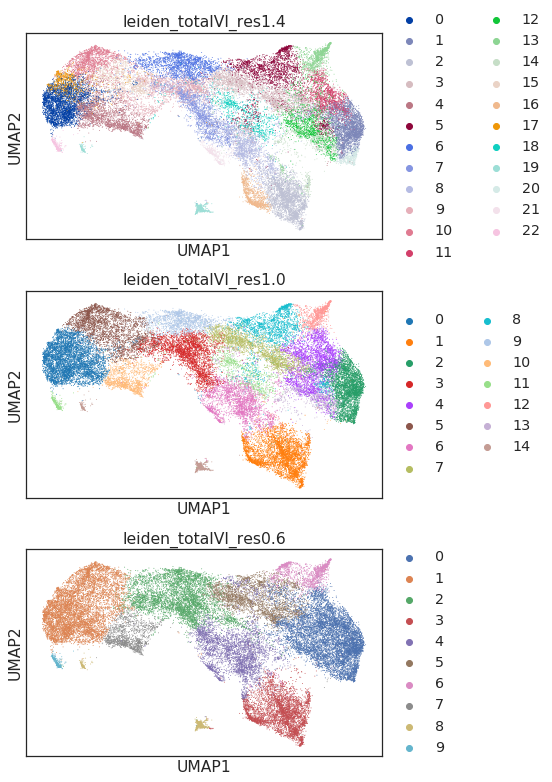

In [40]:
# Plot clusters
sc.pl.umap(
    post_adata, 
    color=["leiden_totalVI_res1.4", "leiden_totalVI_res1.0", "leiden_totalVI_res0.6"], 
    ncols = 1
)

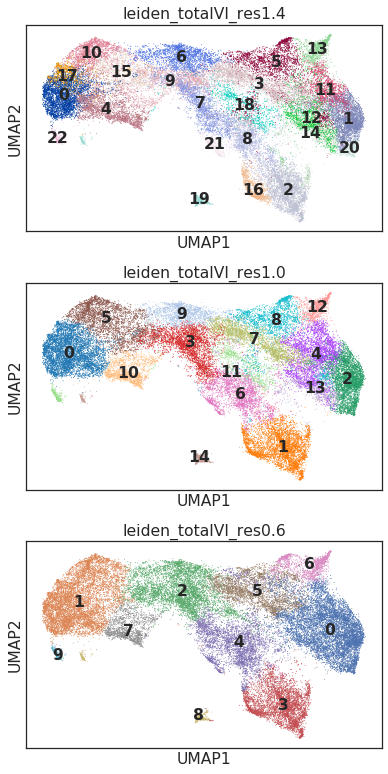

In [41]:
# Plot clusters on data
sc.pl.umap(
    post_adata, 
    color=["leiden_totalVI_res1.4", "leiden_totalVI_res1.0", "leiden_totalVI_res0.6"], 
    ncols = 1,
    legend_loc = "on data"
)

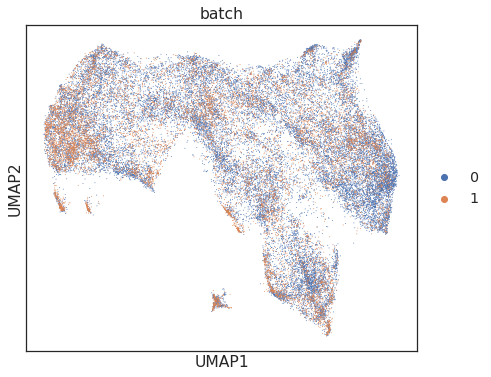

In [42]:
# Plot batches (Berkeley, BioLegend)
fig, ax = plt.subplots(figsize=(7, 6))
sc.pl.umap(
    post_adata, 
    color=["batch"], 
    ax=ax
)

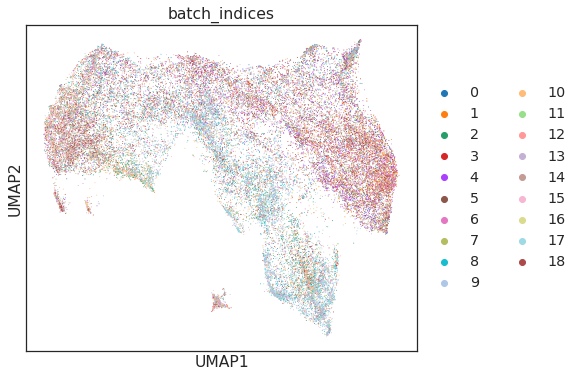

In [43]:
# Plot samples (19 mice)
fig, ax = plt.subplots(figsize=(7, 6))
sc.pl.umap(
    post_adata, 
    color=["batch_indices"], 
    ax=ax
)

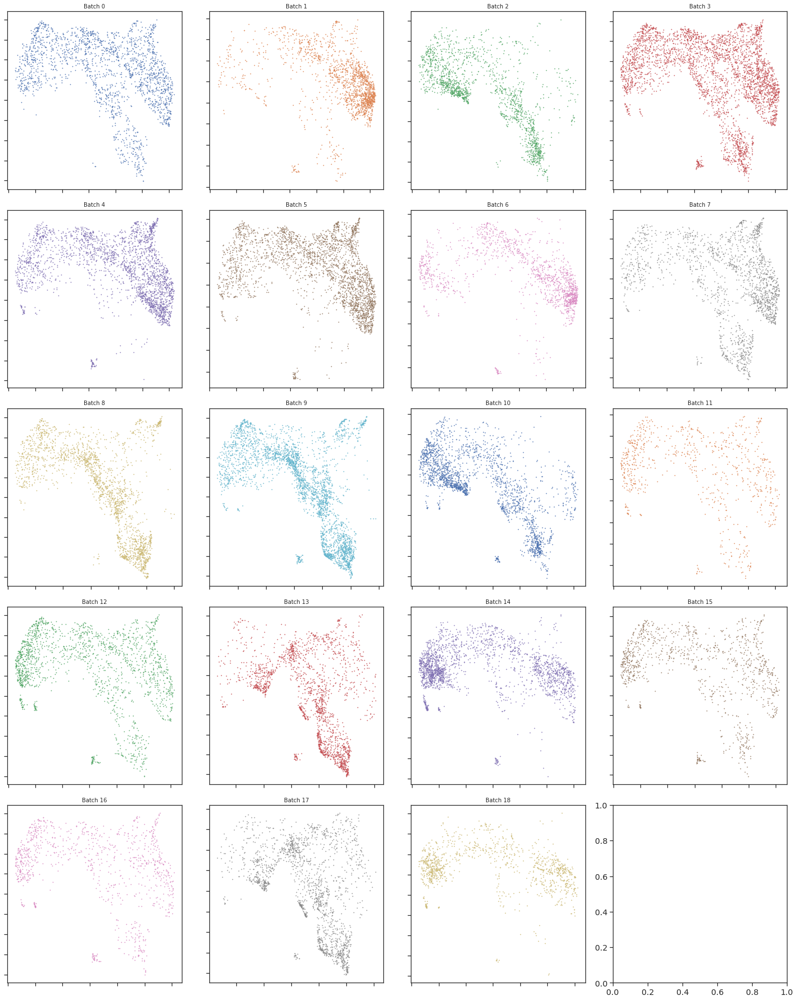

In [61]:
# Plot each sample (mouse) individually
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

fig, ax = plt.subplots(5, 4, figsize=(20, 25))
batches = dataset.batch_indices.ravel()
for b in np.unique(batches):
    ax.flat[b].scatter(post_adata.obsm["X_umap"][batches==b, 0], post_adata.obsm["X_umap"][batches==b, 1], s=.5, color = colors[b%10])
    ax.flat[b].set_title("Batch " + str(b), fontsize = 10)
    ax.flat[b].set_yticklabels([])
    ax.flat[b].set_xticklabels([])
    
plt.tight_layout()

### Add protein denoised counts to anndata

In [46]:
# Add denoised protein counts to adata.obs for plotting
for i, p in enumerate(dataset.protein_names):
    post_adata.obs["{}_fore_prob".format(p)] = protein_foreground_prob[p].values
    post_adata.obs["{}".format(p)] = denoised_proteins[:, i] # each protein's count is its denoised value

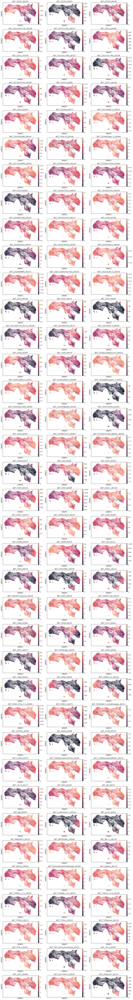

In [58]:
# Plot denoised protein counts
sc.pl.umap(
    post_adata, 
    color=dataset.protein_names, 
    ncols=3,
    vmax = "p99.5"
)

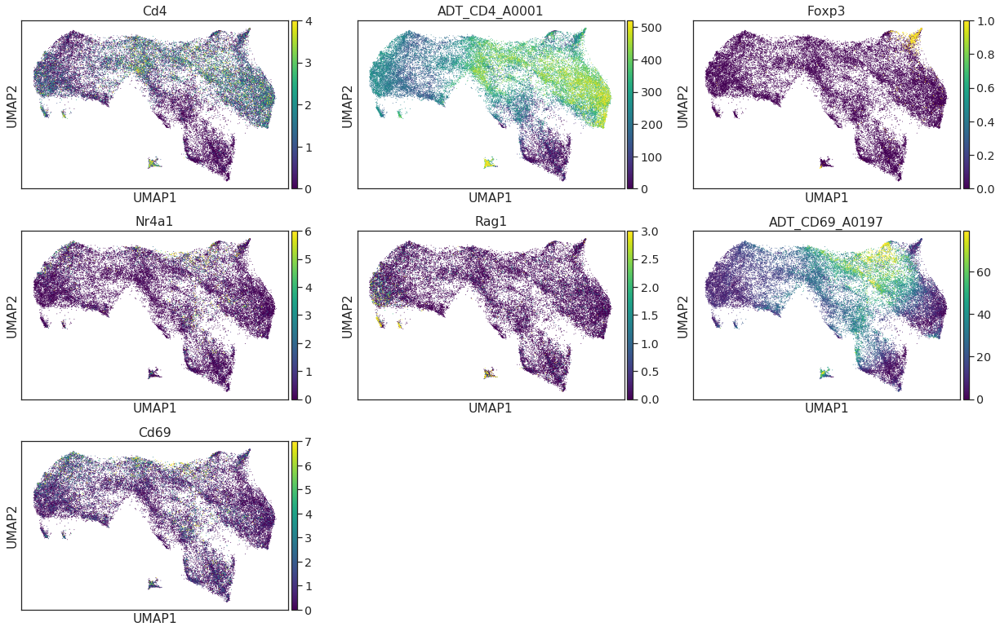

In [59]:
# Plot selected markers
sc.pl.umap(
    post_adata, 
    color=["Cd4", "ADT_CD4_A0001", "Foxp3", "Nr4a1", "Rag1", "ADT_CD69_A0197", "Cd69"],
    ncols = 3,
    vmax = "p99",
    cmap = "viridis"
)

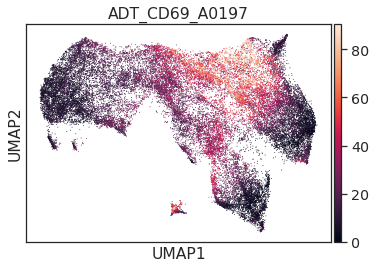

In [56]:
sc.pl.umap(
    post_adata, 
    color=["ADT_CD69_A0197"],
    ncols = 3,
    vmax = "p99.5"
)

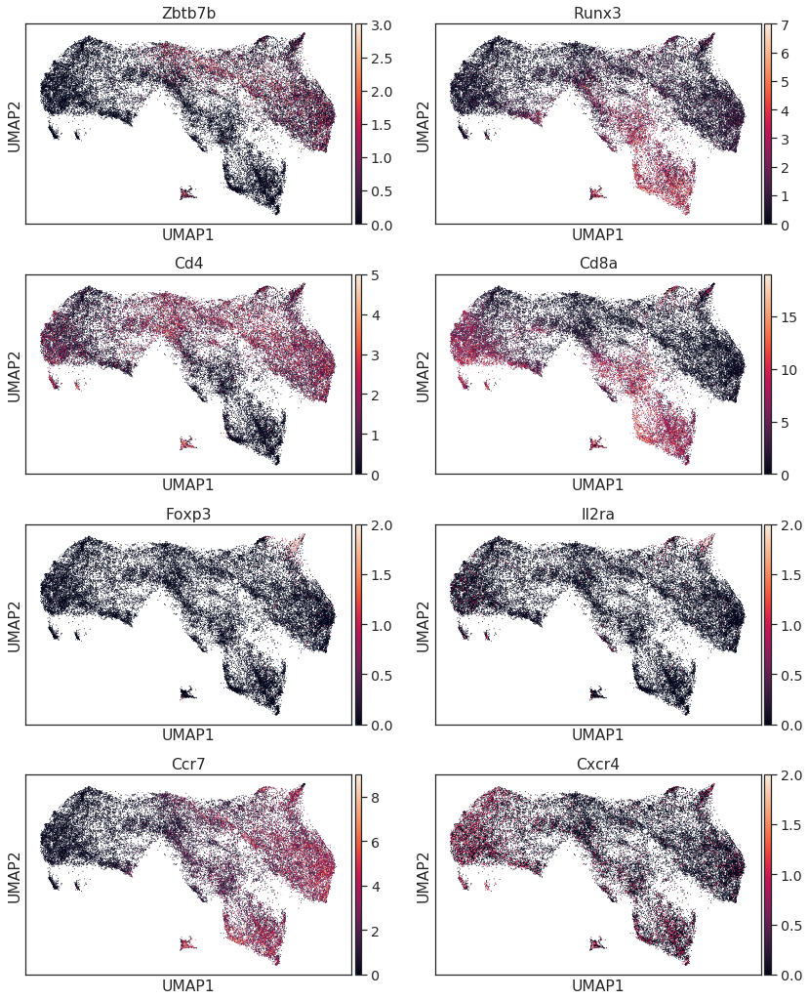

In [52]:
# Plot additional markers
sc.pl.umap(
    post_adata, 
    color=["Zbtb7b", "Runx3", "Cd4", "Cd8a", "Foxp3", "Il2ra", "Ccr7", "Cxcr4"], 
    ncols = 2,
    vmax = "p99.5"
)

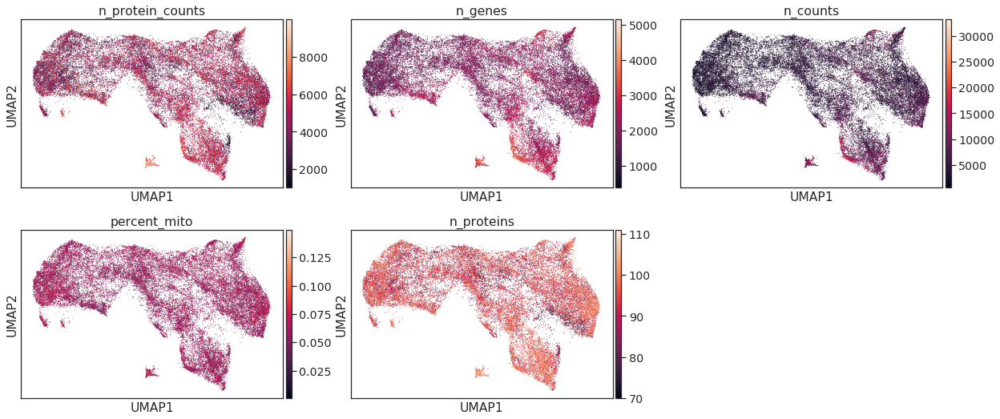

In [53]:
# Plot metadata
sc.pl.umap(
    post_adata, 
    color=["n_protein_counts", 'n_genes', "n_counts", "percent_mito", "n_proteins"],
    ncols = 3
)

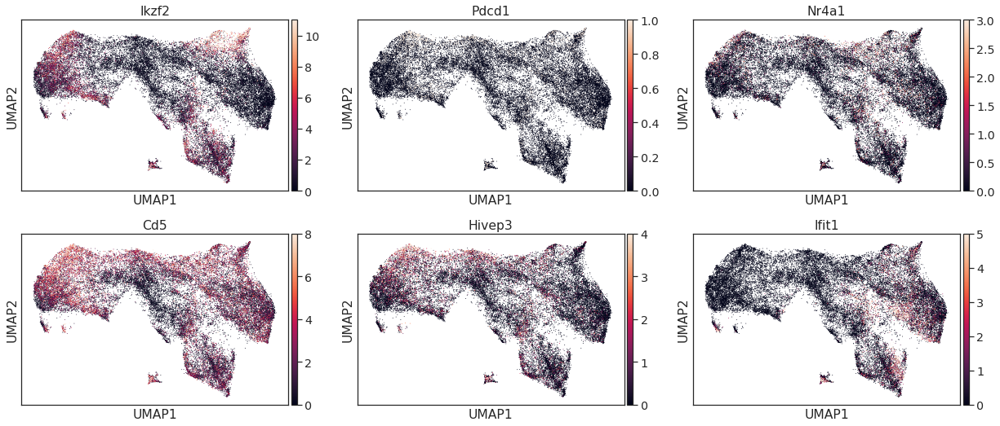

In [54]:
# Plot additional markers (potential clusters to remove)
sc.pl.umap(
    post_adata, 
    color=["Ikzf2", "Pdcd1", "Nr4a1", "Cd5", "Hivep3", "Ifit1"],
    ncols = 3,
    vmax = "p98"
)

## Save output

In [5]:
post_adata

AnnData object with n_obs × n_vars = 35943 × 5108
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_protein_counts', 'n_proteins', 'batch', 'n_genes', 'leiden_totalVI_res1.4', 'leiden_totalVI_res1.0', 'leiden_totalVI_res0.6', 'ADT_CD102_A0104_fore_prob', 'ADT_CD102_A0104', 'ADT_CD103_A0201_fore_prob', 'ADT_CD103_A0201', 'ADT_CD106_A0226_fore_prob', 'ADT_CD106_A0226', 'ADT_CD115(CSF-1R)_A0105_fore_prob', 'ADT_CD115(CSF-1R)_A0105', 'ADT_CD117(c-Kit)_A0012_fore_prob', 'ADT_CD117(c-Kit)_A0012', 'ADT_CD11a_A0595_fore_prob', 'ADT_CD11a_A0595', 'ADT_CD11c_A0106_fore_prob', 'ADT_CD11c_A0106', 'ADT_CD122(IL-2Rb)_A0227_fore_prob', 'ADT_CD122(IL-2Rb)_A0227', 'ADT_CD127(IL-7Ra)_A0198_fore_prob', 'ADT_CD127(IL-7Ra)_A0198', 'ADT_CD134(OX-40)_A0195_fore_prob', 'ADT_CD134(OX-40)_A0195', 'ADT_CD135_A0098_fore_prob', 'ADT_CD135_A0098', 'ADT_CD137_A0194_fore_prob', 'ADT_CD137_A0194', 'ADT_CD14_A0424_fore_prob', 'ADT_CD14_A0424', 'ADT_CD140a_A0573_fore_prob', 'ADT_CD140a_A0573', 'ADT_CD15(SSEA-1)_A

In [64]:
os.getcwd()

'/data/yosef2/users/zsteier/TotalSeq/20190814_BioLegend_ZRS08/analysis/totalVI_thymus/thymus111_allbatches_stable_posselecting'

In [65]:
# Save posterior adata
post_adata.write("posterior_adata.h5ad", compression="gzip")

In [4]:
# # load post_adata
# post_adata = anndata.read("posterior_adata.h5ad")

In [8]:
# Extract dataframes from anndata

# Obsm (latent space, UMAP, denoised proteins, denoised genes)
latent_df = pd.DataFrame(post_adata.obsm["X_totalVI"])
umap_df = pd.DataFrame(post_adata.obsm["X_umap"])
denoised_proteins_df = pd.DataFrame(post_adata.obsm["denoised_proteins"])
raw_proteins_df = pd.DataFrame(post_adata.obsm["protein_expression"])

# Uns (gene and protein names)
totalVI_genes_df = pd.DataFrame(post_adata.uns["totalVI_genes"])
totalVI_proteins_df = pd.DataFrame(post_adata.uns["totalVI_proteins"])

# X (the gene data matrix)
raw_genes_df = pd.DataFrame(post_adata.X)

# Obs
obs_df = pd.DataFrame(post_adata.obs)

In [6]:
denoised_genes_df = pd.DataFrame(post_adata.obsm["denoised_genes"])
denoised_genes_df.shape

(35943, 5108)

In [67]:
# Write csvs for analysis in R, compress with .gz
# Note: this will take a few minutes. Avoid running this multiple times (only necessary to save the raw data once).
save_path = "/data/yosef2/users/zsteier/TotalSeq/20190814_BioLegend_ZRS08/analysis/totalVI_thymus/thymus111_allbatches_stable_posselecting/totalVI_results/"

latent_df.to_csv(save_path + "latent.csv.gz")
umap_df.to_csv(save_path + "umap.csv.gz")
denoised_proteins_df.to_csv(save_path + "denoised_proteins.csv.gz")
denoised_genes_df.to_csv(save_path + "denoised_genes.csv.gz")
raw_proteins_df.to_csv(save_path + "raw_proteins.csv.gz")
totalVI_genes_df.to_csv(save_path + "totalVI_genes.csv.gz")
totalVI_proteins_df.to_csv(save_path + "totalVI_proteins.csv.gz")
raw_genes_df.to_csv(save_path + "raw_genes.csv.gz")
obs_df.to_csv(save_path + "obs.csv.gz", index = True)